In [1]:
import numpy as np
import rosbag
import os
import yaml
import rospy

import numpy 
import matplotlib.pyplot as plt

from IPython.display import clear_output

from tqdm import tqdm
import logging
logger = logging.getLogger()
logger.setLevel(logging.DEBUG)


# PARSE THE DATA

We are using Ros1 bags in to be able to parse data as we couldn't find a convenient way to read ros2 databases yet.

**OAK-D**
- /stereo/depth
- /color/video/image

**Ouster S1**
- /points
    - XYZI data has been parsed 

**VN100**
- /vn100_imu 

In [2]:
'''Parses the XYZI data from the Pointcloud2 type of Ros messages'''
def ParseLidarData(lidar_msg_generator, number_of_messages, downsample_rate):
    lidar_data = []
    
    for i in tqdm(range(number_of_messages)):
        _, lidar_msg, lidar_t = next(lidar_messages)
        
        if((i % downsample_rate) != 0):
            continue
        
        xyzi = np.zeros((lidar_msg.height*lidar_msg.width,4))
        laser_idx = 0
        for p in pc2.read_points(lidar_msg, field_names = ("x", "y", "z", "intensity"), skip_nans=True):
            xyzi[laser_idx] = np.array(p[0:4])
        lidar_data.append([lidar_t, xyzi])
        
    logging.info('Parsed the lidar data!')
    return lidar_data

'''Parses the Color Image data from the Image type of Ros messages'''
def ParseColorImageData(image_msg_generator, number_of_messages, downsample_rate):
    color_image_data = []
    
    for i in tqdm(range(number_of_messages)):
        _, image_msg, image_t = next(image_msg_generator)
        
        if((i % downsample_rate) != 0):
            continue
        
        image_data = np.frombuffer(image_msg.data, np.uint8)
        # bgr to rgb 
        image_data_reshaped = np.reshape(image_data, (image_msg.height, image_msg.width, 3))
        image_data_reshaped = image_data_reshaped[:,:,::-1]
        color_image_data.append([image_t, image_data_reshaped])
    logging.info('Parsed the camera data!')
    return color_image_data

'''Parses the Depth Image data from the Image type of Ros messages'''
def ParseDepthImageData(image_msg_generator, number_of_messages, downsample_rate):
    depth_image_data = []
    
    for i in tqdm(range(number_of_messages)):
        _, depth_image_msg, depth_image_t = next(image_msg_generator)
        
        if((i % downsample_rate) != 0):
            continue
        raw_data = np.frombuffer(depth_image_msg.data, np.uint8)
        image_data = np.zeros(depth_image_msg.height * depth_image_msg.width, np.uint16)
        for i in range(depth_image_msg.height * depth_image_msg.width):
            image_data[i] = raw_data[2*i] + raw_data[2*i] << 8
        depth_image_data.append([depth_image_t, image_data])
    
    logging.info('Parsed the camera data!')
    return depth_image_data

'''Parses the VN100 IMU data from the IMU type of Ros messages'''
def ParseVN100ImuData(imu_msg_generator, number_of_messages, downsample_rate):
    imu_data = []
    
    for i in tqdm(range(number_of_messages)):
        _, imu_msg, imu_t = next(imu_msg_generator)
        if((i % downsample_rate) != 0):
            continue
        imu_data.append([imu_t, imu_msg.orientation, imu_msg.orientation_covariance, imu_msg.angular_velocity, imu_msg.linear_acceleration])
    logging.info('Parsed the imu data!')

    return imu_data


In [3]:
bag_file_path = '/home/jpdemir/c-hopper/data/edr_demo/predemo_drone_flying_and_taking_measurement_124115/oakd_ouster_vn100.bag'
bag = rosbag.Bag(bag_file_path, "r")

print(bag.get_type_and_topic_info().topics)

lidar_messages = bag.read_messages(topics=['/points'])
n_lidar = bag.get_message_count(topic_filters=["/points"])
lidar_downsample_rate = 1000

color_image_messages = bag.read_messages(topics=['/color/video/image'])
n_images = bag.get_message_count(topic_filters=["/color/video/image"])
image_downsample_rate = 6

color_camera_info_messages = bag.read_messages(topics=['/color/video/camera_info'])
_, camera_info, camera_info_t = next(color_camera_info_messages)
     
depth_image_messages = bag.read_messages(topics=['/stereo/depth'])
n_depth_images = bag.get_message_count(topic_filters=["/stereo/depth"])

imu_messages = bag.read_messages(topics=['/vn100_imu'])
n_imu_messages = bag.get_message_count(topic_filters=["/vn100_imu"])
imu_downsample_rate = 1

logging.info('Loaded the data!')

lidar_data = ParseLidarData(lidar_messages, n_lidar, lidar_downsample_rate)
    

image_data = ParseColorImageData(color_image_messages, n_images, image_downsample_rate)

imu_data = ParseVN100ImuData(imu_messages,n_imu_messages, imu_downsample_rate)

logging.info('Finished data parsing!')

INFO:root:Loaded the data!


{'/color/video/camera_info': TopicTuple(msg_type='sensor_msgs/CameraInfo', message_count=22151, connections=1, frequency=30.241641611328618), '/color/video/image': TopicTuple(msg_type='sensor_msgs/Image', message_count=6371, connections=1, frequency=18.97321370007396), '/points': TopicTuple(msg_type='sensor_msgs/PointCloud2', message_count=11225, connections=1, frequency=19.47329348267657), '/stereo/camera_info': TopicTuple(msg_type='sensor_msgs/CameraInfo', message_count=686, connections=1, frequency=0.8607539033817337), '/stereo/depth': TopicTuple(msg_type='sensor_msgs/Image', message_count=4863, connections=1, frequency=6.140641836495666), '/vn100_imu': TopicTuple(msg_type='sensor_msgs/Imu', message_count=6575, connections=1, frequency=8.010228821174195)}


100%|████████████████████████████████████████████████████████████████████████████| 11225/11225 [00:15<00:00, 721.66it/s]
INFO:root:Parsed the lidar data!
100%|██████████████████████████████████████████████████████████████████████████████| 6371/6371 [00:27<00:00, 234.58it/s]
INFO:root:Parsed the camera data!
100%|██████████████████████████████████████████████████████████████████████████████| 6575/6575 [00:09<00:00, 696.41it/s]
INFO:root:Parsed the imu data!
INFO:root:Finished data parsing!


In [5]:
color_camera_info_messages = bag.read_messages(topics=['/color/video/camera_info'])
_, camera_info, camera_info_t = next(color_camera_info_messages)

# IMU DATA

In [6]:
# find time delta for the upcoming frames
def GetRelativeTimestamps(data):
    start_time = data[0][0].secs*1e9 + data[0][0].nsecs
    delta_t = [((frame[0].secs*1e9 + frame[0].nsecs) - start_time)/1e9 for frame in data]

    return np.array(delta_t)

In [7]:
# Gravitational acceleration 
g = 9.81 # m/s^2

delta_t = GetRelativeTimestamps(imu_data)

linear_acc_x = np.array([frame[4].x for frame in imu_data])
linear_acc_y = np.array([frame[4].y for frame in imu_data])
linear_acc_z = np.array([frame[4].z for frame in imu_data]) + g

# Data retro
As one can see from above, IMU data has some problems with it. First of all, it is quite noisy and a meaningful filter needed to be used for it so data can be smoothened out. Secondly, after 650th frame there is an instant jump in the data and that is not expected.

## Noisy data

https://dsp.stackexchange.com/questions/3026/picking-the-correct-filter-for-accelerometer-data
The link shared above gives a really good overview about what type of filter needed to be used for the acceleration data. Basically it says, due to noise spectrum having a flat spectrum in other words all the frequiencies contributing to the noise we can not use any frequency based filtering.

The suggestion comes to wavelet denoising.

link -> https://blancosilva.wordpress.com/teaching/mathematical-imaging/denoising-wavelet-thresholding/

## Instant drop in the data

Check the data, visually determine a cutoff value and crop the rest of the data

In [8]:
import numpy
import scipy
import pywt

# Wavelet denoising for the data
def wavelet_denoise(data, wavelet, noise_sigma):
    '''Filter accelerometer data using wavelet denoising

    Modification of F. Blanco-Silva's code at: https://goo.gl/gOQwy5
    '''

    wavelet = pywt.Wavelet(wavelet)
    levels  = min(15, (numpy.floor(numpy.log2(data.shape[0]))).astype(int))

    # Francisco's code used wavedec2 for image data
    wavelet_coeffs = pywt.wavedec(data, wavelet, level=levels)
    threshold = noise_sigma*numpy.sqrt(2*numpy.log2(data.size))

    new_wavelet_coeffs = map(lambda x: pywt.threshold(x, threshold, mode='soft'),
                             wavelet_coeffs)

    return pywt.waverec(list(new_wavelet_coeffs), wavelet)

In [9]:
# Drop the index
cutoff_value = 650
abs_cutoff_delta_t = np.abs(delta_t - cutoff_value)
cutoff_idx = np.argmin(abs_cutoff_delta_t)

delta_t = delta_t[:cutoff_idx]
linear_acc_x = linear_acc_x[:cutoff_idx]
linear_acc_y = linear_acc_y[:cutoff_idx]
linear_acc_z = linear_acc_z[:cutoff_idx]


error = []
wavelet_name = []
for wavelet in pywt.wavelist():
    try:
        linear_acc_filtered_x = wavelet_denoise(linear_acc_x, wavelet, np.std(linear_acc_x))
        residual = np.mean(np.abs(linear_acc_filtered_x - linear_acc_x))
        error.append(residual)
        wavelet_name.append(wavelet)
    except:
        print(f"Not supported wavelet {wavelet}")

min_val = min(error[:])
min_val_idx = error.index(min_val)

print(f'Name of the wavelet type: {wavelet_name[min_val_idx]}')

Not supported wavelet cgau1
Not supported wavelet cgau2
Not supported wavelet cgau3
Not supported wavelet cgau4
Not supported wavelet cgau5
Not supported wavelet cgau6
Not supported wavelet cgau7
Not supported wavelet cgau8
Not supported wavelet cmor
Not supported wavelet fbsp
Not supported wavelet gaus1
Not supported wavelet gaus2
Not supported wavelet gaus3
Not supported wavelet gaus4
Not supported wavelet gaus5
Not supported wavelet gaus6
Not supported wavelet gaus7
Not supported wavelet gaus8
Not supported wavelet mexh
Not supported wavelet morl
Not supported wavelet shan
Name of the wavelet type: bior3.9


/home/jpdemir/c-hopper/data/edr_demo/handheld_visualisation/lib/python3.8/site-packages/pywt/_multilevel.py:43: UserWarning: Level value of 12 is too high: all coefficients will experience boundary effects.
  warnings.warn(


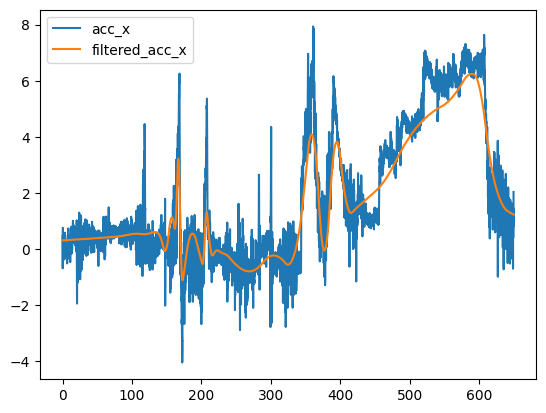

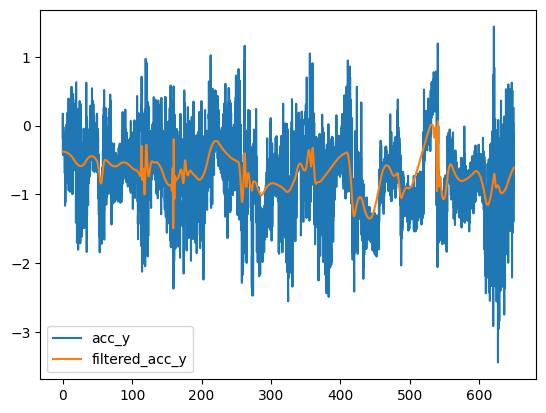

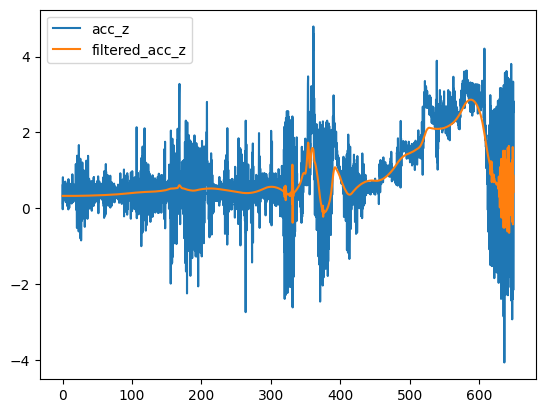

In [11]:
logger.setLevel(logging.NOTSET)

# Acceleration and Velocity

linear_acc_filtered_x = wavelet_denoise(linear_acc_x, 'bior3.9', np.std(linear_acc_x))
plt.plot(delta_t, linear_acc_x, label = "acc_x")
plt.plot(delta_t, linear_acc_filtered_x, label = "filtered_acc_x")
plt.legend()
plt.show()

linear_acc_filtered_y = wavelet_denoise(linear_acc_y, 'bior3.9', np.std(linear_acc_y))
plt.plot(delta_t, linear_acc_y, label = "acc_y")
plt.plot(delta_t, linear_acc_filtered_y, label = "filtered_acc_y")
plt.legend()
plt.show()

linear_acc_filtered_z = wavelet_denoise(linear_acc_z, 'bior3.9', np.std(linear_acc_z))
plt.plot(delta_t, linear_acc_z, label = "acc_z")
plt.plot(delta_t, linear_acc_filtered_z, label = "filtered_acc_z")
plt.legend()
plt.show()

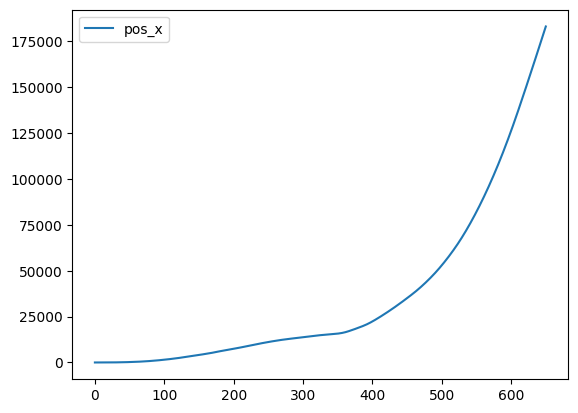

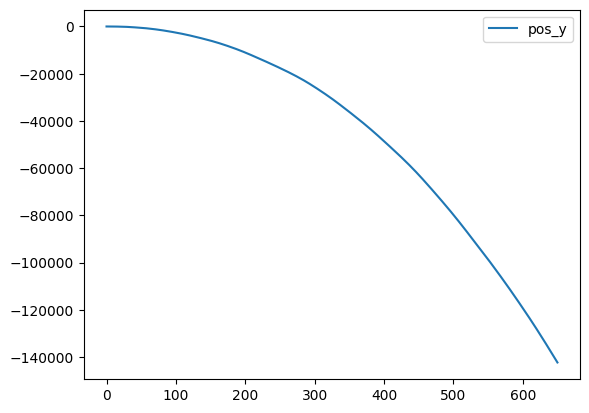

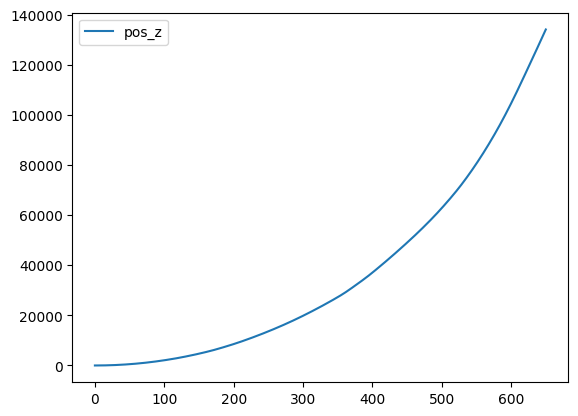

In [12]:
import scipy.integrate as it

logger.setLevel(logging.NOTSET)

# Acceleration and Velocity

linear_vel_x = it.cumtrapz(linear_acc_x, delta_t, initial=0.0)
linear_pos_x = it.cumtrapz(linear_vel_x, delta_t, initial=0.0)

#plt.plot(delta_t, linear_acc_x, label = "acc_x")
#plt.plot(delta_t, linear_vel_x, label = "vel_x")
plt.plot(delta_t, linear_pos_x, label = "pos_x")
plt.legend()
plt.show()

linear_vel_y = it.cumtrapz(linear_acc_y, delta_t, initial=0.0)
linear_pos_y = it.cumtrapz(linear_vel_y, delta_t, initial=0.0)

#plt.plot(delta_t, linear_acc_y, label = "acc_y")
#plt.plot(delta_t, linear_vel_y, label = "vel_y")
plt.plot(delta_t, linear_pos_y, label = "pos_y")
plt.legend()
plt.show()

linear_vel_z = it.cumtrapz(linear_acc_z, delta_t, initial=0.0)
linear_pos_z = it.cumtrapz(linear_vel_z, delta_t, initial=0.0)

#plt.plot(delta_t, linear_acc_z, label = "acc_z")
#plt.plot(delta_t, linear_vel_z, label = "vel_z")
plt.plot(delta_t, linear_pos_z, label = "pos_z")
plt.legend()
plt.show()


# integration retro
There are significant amount of drift for all the acceleration components and I am not sure whether the data can be used at all :( 

The next steps will be focusing more in to the image and lidar pipeline to recover the odometry

# Image Data

## Monocular VO pipeline
https://github.com/polygon-software/python-visual-odometry/blob/master/Chapter%2011%20-%20Visual%20Odometry%20Visual%20SLAM.ipynb 

https://github.com/caomw/visual_odometry-1/blob/master/src/py_MVO.py

**
https://avisingh599.github.io/vision/visual-odometry-full/

https://github.com/uoip/monoVO-python/blob/master/visual_odometry.py

### Camera Model

The camera we are using just provides `rational polynomial` represented camera model.

we will need to read that -> https://www.robots.ox.ac.uk/~vgg/publications/2005/Claus05a/claus05a.pdf
to come up with traditional way of undistorting the camera

we may can undistort the whole image based on the following function given in 

```cpp
switch (cache_->distortion_model) {
    case PLUMB_BOB_OR_RATIONAL_POLYNOMIAL:
      cv::undistortPoints(src_pt, dst_pt, K, D_, R_, P);
      break;
    case EQUIDISTANT:
      cv::fisheye::undistortPoints(src_pt, dst_pt, K, D_, R_, P);
      break;
    default:
      assert(cache_->distortion_model == UNKNOWN_MODEL);
      throw Exception("Wrong distortion model. Supported models: PLUMB_BOB, RATIONAL_POLYNOMIAL and EQUIDISTANT.");
  }
```

https://github.com/ros-perception/vision_opencv/blob/c791220cefd0abf02c6719e2ce0fea465857a88e/image_geometry/src/pinhole_camera_model.cpp#L404

Also, the intrinsics values are needed to solve the odometry problem.


Finally I found the meaning of the fields in the projection matrix

```
header: 
  seq: 0
  stamp: 
    secs: 1661258484
    nsecs: 369285391
  frame_id: "oak_rgb_camera_optical_frame"
height: 1080
width: 1920
distortion_model: "rational_polynomial"
d: [25.663156509399414, -218.04647827148438, 0.00047676885151304305, -0.00021448465122375637, 620.961181640625, 25.17365264892578, -214.8468475341797, 611.5280151367188]
k: [1549.841796875, 0.0, 935.3917846679688, 0.0, 1549.841796875, 552.15234375, 0.0, 0.0, 1.0]
r: [1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0]
p: [1549.841796875, 0.0, 935.3917846679688, 0.0, 0.0, 1549.841796875, 552.15234375, 0.0, 0.0, 0.0, 1.0, 0.0]
binning_x: 0
binning_y: 0
roi: 
  x_offset: 0
  y_offset: 0
  height: 0
  width: 0
  do_rectify: False
```

https://docs.opencv.org/3.4/d9/d0c/group__calib3d.html#gaaae5a7899faa1ffdf268cd9088940248

Here P correspond to the projection matrix which has already the rotation and translation. As we have a monocular camera that basically means

```
[fx 0 cx 0]
[0 fy cy 0]
[0 0  1  1]
```

or basically we can use

```python
cv2.decomposeProjectionMatrix(np.reshape(camera_info.p,(3,4)))
```

```
(array([[1.54984180e+03, 0.00000000e+00, 9.35391785e+02],
        [0.00000000e+00, 1.54984180e+03, 5.52152344e+02],
        [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]]),
 array([[1., 0., 0.],
        [0., 1., 0.],
        [0., 0., 1.]]),
 array([[0.],
        [0.],
        [0.],
        [1.]]),
 array([[ 1.,  0.,  0.],
        [ 0.,  1.,  0.],
        [ 0., -0.,  1.]]),
 array([[ 1.,  0.,  0.],
        [ 0.,  1.,  0.],
        [-0.,  0.,  1.]]),
 array([[ 1.,  0.,  0.],
        [-0.,  1.,  0.],
        [ 0.,  0.,  1.]]),
 array([[0.],
        [0.],
        [0.]]))
1
​
```


# First VO test
https://github.com/uoip/monoVO-python/blob/master/visual_odometry.py


In [20]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [66]:
%reload_ext autoreload

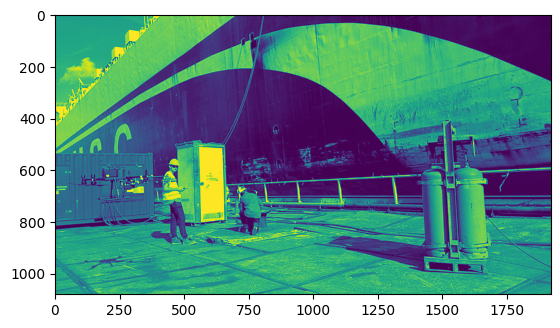

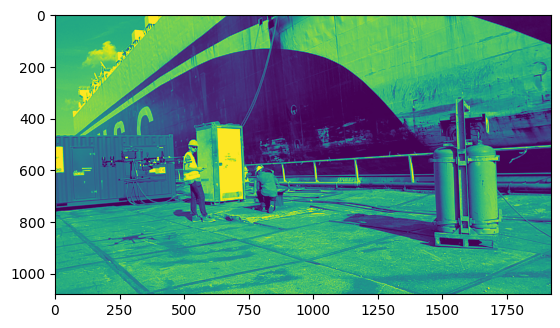

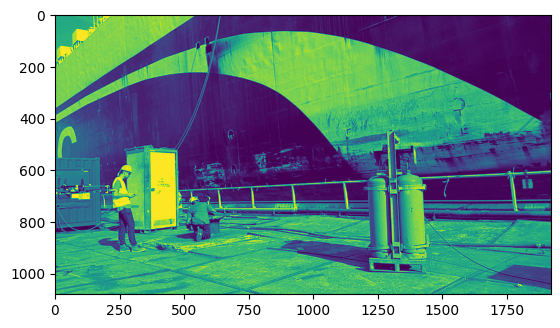

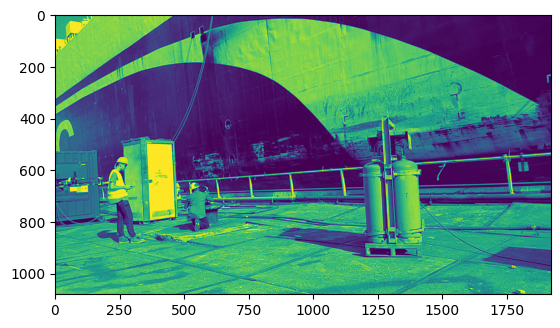

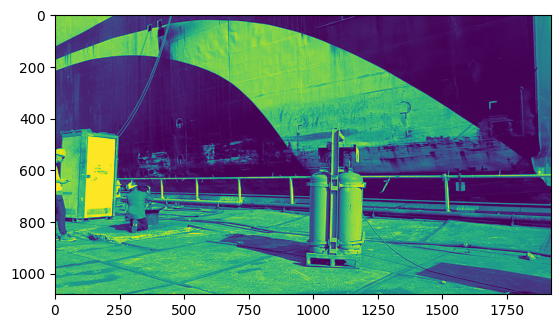

...

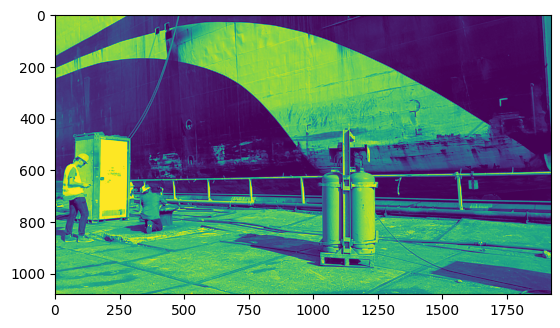

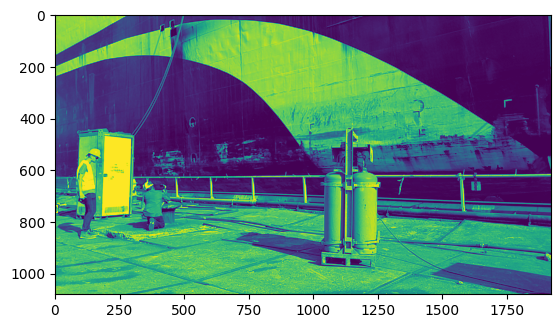

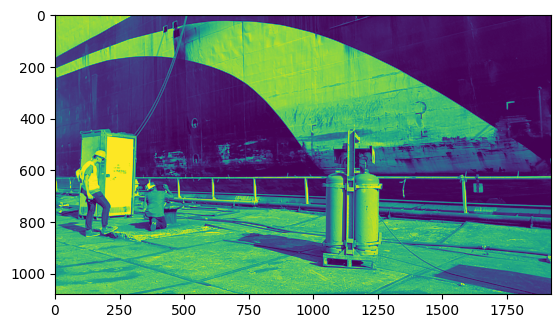

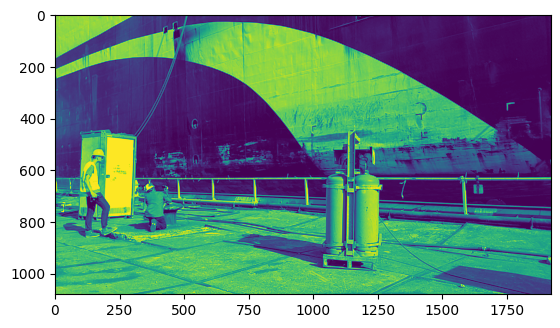

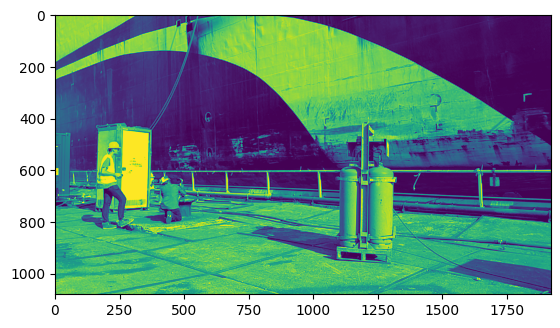

In [39]:
import cv2 

for i in range(38,60):
    image = cv2.cvtColor(image_data[i][1], cv2.COLOR_RGB2GRAY )
    plt.imshow(image)
    plt.show()

In [33]:
from visual_odometry import PinholeCamera, VisualOdometry

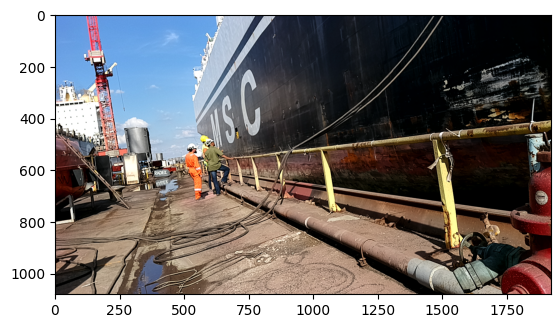

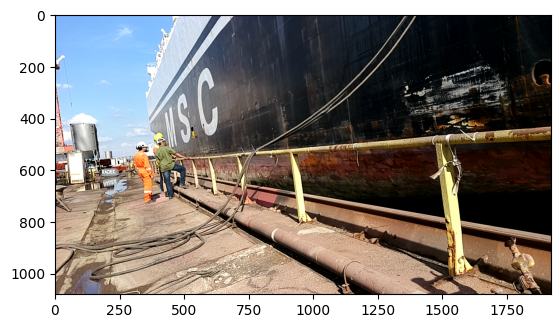

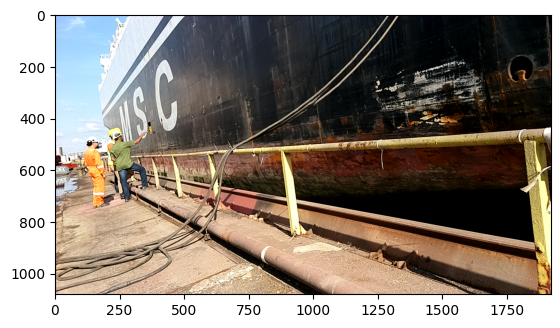

In [65]:
plt.imshow(image_data[219][1])
plt.show()

plt.imshow(image_data[220][1])
plt.show()

plt.imshow(image_data[221][1])
plt.show()

In [68]:
fx = 1549.84
fy = 1549.84
cx = 935.391
cy = 552.152

cam = PinholeCamera(camera_info.width, camera_info.height, fx, fy, cy, cx)
vo = VisualOdometry(cam)

traj = np.zeros((len(image_data),3))
# VO needs to be reinitialised if a new image stream is passed
for img_id in range(len(image_data)):
    # This VO tool is picky a
    image = cv2.cvtColor(image_data[img_id][1], cv2.COLOR_RGB2GRAY)
    vo.update(image, img_id)

    cur_t = vo.cur_t
    if(img_id > 2):
        x, y, z = cur_t[0], cur_t[1], cur_t[2]
    else:
        x, y, z = 0., 0., 0.
    print(f"The coordinates for the frame {img_id} is: {x} {y} {z}")
    traj[img_id][0] = x
    traj[img_id][1] = y
    traj[img_id][2] = z    

The coordinates for the frame 0 is: 0.0 0.0 0.0
The coordinates for the frame 1 is: 0.0 0.0 0.0
Number of features are less than expected, re-run detection on the last frame!
The coordinates for the frame 2 is: 0.0 0.0 0.0
The coordinates for the frame 3 is: [2.36805936] [-0.41650165] [0.32143642]
The coordinates for the frame 4 is: [3.12280932] [-0.51273654] [-0.32747909]
The coordinates for the frame 5 is: [4.09704085] [-0.66647445] [-0.49251722]
The coordinates for the frame 6 is: [4.47277601] [0.21968526] [-0.22132713]
The coordinates for the frame 7 is: [3.82651087] [0.5032435] [-0.92980162]
The coordinates for the frame 8 is: [3.35814269] [0.48204328] [-0.04652261]
The coordinates for the frame 9 is: [3.80908251] [0.1567971] [0.7846622]
The coordinates for the frame 10 is: [2.84307726] [0.33329403] [0.59576355]
The coordinates for the frame 11 is: [2.31548784] [0.61136708] [-0.20693489]
The coordinates for the frame 12 is: [3.12391564] [0.60772423] [0.3816492]
The coordinates for

The coordinates for the frame 104 is: [-4.12803305] [-9.97182416] [0.48158157]
The coordinates for the frame 105 is: [-3.62044368] [-10.75234998] [0.84645482]
The coordinates for the frame 106 is: [-4.3518491] [-11.39849167] [1.06450764]
The coordinates for the frame 107 is: [-3.41290577] [-11.28834395] [0.73854307]
The coordinates for the frame 108 is: [-2.48099511] [-11.49569002] [0.44096932]
The coordinates for the frame 109 is: [-3.39418769] [-11.552199] [0.84456075]
The coordinates for the frame 110 is: [-4.32228739] [-11.21844797] [1.00960985]
The coordinates for the frame 111 is: [-3.515875] [-11.80980148] [1.00932042]
The coordinates for the frame 112 is: [-4.45348589] [-11.57067643] [1.26171897]
The coordinates for the frame 113 is: [-5.3753412] [-11.28289502] [1.52126598]
The coordinates for the frame 114 is: [-6.02750463] [-10.53521574] [1.39613187]
The coordinates for the frame 115 is: [-6.84194011] [-10.10959013] [1.79051453]
The coordinates for the frame 116 is: [-6.35388

The coordinates for the frame 201 is: [-13.76970767] [-25.77149733] [-11.57487982]
The coordinates for the frame 202 is: [-14.46025444] [-26.40808326] [-11.91825063]
The coordinates for the frame 203 is: [-15.27843033] [-26.93373444] [-12.1512293]
The coordinates for the frame 204 is: [-14.5453557] [-26.31467579] [-11.86950607]
The coordinates for the frame 205 is: [-15.38558984] [-26.84608503] [-11.97725949]
The coordinates for the frame 206 is: [-14.39476141] [-26.7850286] [-12.09780459]
The coordinates for the frame 207 is: [-15.182565] [-27.37974509] [-12.25804751]
The coordinates for the frame 208 is: [-14.25318903] [-27.49851357] [-12.60755339]
The coordinates for the frame 209 is: [-13.3713442] [-27.08550552] [-12.38001427]
The coordinates for the frame 210 is: [-14.00377305] [-27.78788446] [-12.70666021]
The coordinates for the frame 211 is: [-14.72222707] [-28.41187337] [-13.01400638]
The coordinates for the frame 212 is: [-15.41447022] [-29.07508135] [-13.29853158]
The coordi

The coordinates for the frame 295 is: [-16.5676169] [-37.46110807] [-20.9962741]
The coordinates for the frame 296 is: [-15.94314128] [-38.05154399] [-20.4849859]
The coordinates for the frame 297 is: [-15.1355097] [-38.62176905] [-20.33473737]
The coordinates for the frame 298 is: [-15.28681278] [-38.12928567] [-21.19180651]
The coordinates for the frame 299 is: [-14.3797861] [-38.40333529] [-21.51149293]
The coordinates for the frame 300 is: [-14.69816484] [-38.6666315] [-20.60082829]
The coordinates for the frame 301 is: [-14.68823659] [-38.22000556] [-21.49549398]
The coordinates for the frame 302 is: [-13.96956794] [-38.17930256] [-22.18965438]
The coordinates for the frame 303 is: [-13.01704917] [-38.31222838] [-22.46358633]
The coordinates for the frame 304 is: [-13.7426493] [-38.12609002] [-21.80112352]
The coordinates for the frame 305 is: [-12.84118449] [-38.14469031] [-21.36867095]
The coordinates for the frame 306 is: [-12.56172342] [-37.50419084] [-20.65336546]
The coordin

The coordinates for the frame 391 is: [-20.59049117] [-34.75664584] [-15.00557695]
The coordinates for the frame 392 is: [-21.16464502] [-35.53974079] [-14.76660069]
The coordinates for the frame 393 is: [-21.84742749] [-35.24711082] [-14.09714136]
The coordinates for the frame 394 is: [-22.66994421] [-35.68304103] [-13.73185914]
The coordinates for the frame 395 is: [-23.4719918] [-35.96084984] [-14.2605764]
The coordinates for the frame 396 is: [-24.25932573] [-36.11301523] [-14.85803014]
The coordinates for the frame 397 is: [-24.07376167] [-37.04871603] [-14.55798016]
Number of features are less than expected, re-run detection on the last frame!
The coordinates for the frame 398 is: [-24.65813098] [-36.76045629] [-15.31654382]
The coordinates for the frame 399 is: [-25.07268112] [-35.99366566] [-15.80662575]
The coordinates for the frame 400 is: [-25.22774143] [-35.00661204] [-15.84763117]
The coordinates for the frame 401 is: [-25.73253527] [-34.19681318] [-16.14664454]
The coordi

The coordinates for the frame 466 is: [-26.76794149] [-20.98635897] [-12.27718881]
Number of features are less than expected, re-run detection on the last frame!
The coordinates for the frame 467 is: [-27.21424364] [-21.88092814] [-12.25351617]
The coordinates for the frame 468 is: [-27.39376242] [-22.30883247] [-13.13933268]
The coordinates for the frame 469 is: [-27.56797937] [-22.8425753] [-12.31182615]
The coordinates for the frame 470 is: [-27.35736338] [-22.18885258] [-11.58499226]
The coordinates for the frame 471 is: [-27.30182162] [-23.14829046] [-11.30859753]
The coordinates for the frame 472 is: [-27.17428066] [-22.58610018] [-10.49148347]
The coordinates for the frame 473 is: [-28.10129741] [-22.27172531] [-10.28701246]
The coordinates for the frame 474 is: [-27.76687944] [-21.36736004] [-10.02189348]
Number of features are less than expected, re-run detection on the last frame!
The coordinates for the frame 475 is: [-28.61091479] [-21.58455321] [-10.51223159]
The coordinat

The coordinates for the frame 562 is: [-35.6156067] [-22.04964705] [-21.29579152]
The coordinates for the frame 563 is: [-36.54422113] [-22.40086948] [-21.17613351]
The coordinates for the frame 564 is: [-36.67730666] [-23.38818055] [-21.26276543]
The coordinates for the frame 565 is: [-36.5540593] [-22.39790935] [-21.19816639]
The coordinates for the frame 566 is: [-35.90009869] [-21.64236709] [-21.15954757]
The coordinates for the frame 567 is: [-36.28622927] [-22.56140543] [-21.23874166]
The coordinates for the frame 568 is: [-35.92776748] [-21.646391] [-21.05366402]
The coordinates for the frame 569 is: [-35.41050209] [-20.85791782] [-20.72087797]
The coordinates for the frame 570 is: [-35.99615009] [-20.090071] [-20.46120955]
The coordinates for the frame 571 is: [-36.20301686] [-20.0407301] [-19.4840854]
The coordinates for the frame 572 is: [-36.84767812] [-20.10702001] [-18.72249659]
The coordinates for the frame 573 is: [-35.88205999] [-19.90745494] [-18.88909613]
The coordina

The coordinates for the frame 669 is: [-28.60122466] [-18.69894245] [-20.74189951]
The coordinates for the frame 670 is: [-28.31001839] [-18.22536777] [-21.57311905]
The coordinates for the frame 671 is: [-28.27998384] [-17.23686469] [-21.42493137]
The coordinates for the frame 672 is: [-28.74178429] [-18.11898686] [-21.51767197]
Number of features are less than expected, re-run detection on the last frame!
The coordinates for the frame 673 is: [-28.75958081] [-18.90007919] [-22.14183385]
Number of features are less than expected, re-run detection on the last frame!
The coordinates for the frame 674 is: [-29.33196415] [-18.40321559] [-21.48952726]
Number of features are less than expected, re-run detection on the last frame!
The coordinates for the frame 675 is: [-29.98741867] [-17.96193689] [-20.87662232]
Number of features are less than expected, re-run detection on the last frame!
The coordinates for the frame 676 is: [-29.47015997] [-18.51714087] [-21.52792254]
The coordinates for 

Number of features are less than expected, re-run detection on the last frame!
The coordinates for the frame 734 is: [-35.98739001] [-19.84161902] [-16.06707324]
Number of features are less than expected, re-run detection on the last frame!
The coordinates for the frame 735 is: [-35.35359819] [-19.21574002] [-16.5215877]
Number of features are less than expected, re-run detection on the last frame!
The coordinates for the frame 736 is: [-36.02442263] [-19.7408261] [-15.997871]
Number of features are less than expected, re-run detection on the last frame!
The coordinates for the frame 737 is: [-36.71831689] [-20.21400928] [-15.45509257]
The coordinates for the frame 738 is: [-37.4284449] [-20.89875157] [-15.29124442]
The coordinates for the frame 739 is: [-36.83682476] [-21.6074216] [-15.67565617]
Number of features are less than expected, re-run detection on the last frame!
The coordinates for the frame 740 is: [-37.06026171] [-22.57035063] [-15.82679722]
Number of features are less th

The coordinates for the frame 799 is: [-34.81405652] [-14.3198031] [-15.66243728]
The coordinates for the frame 800 is: [-34.36440499] [-13.87906761] [-16.43933221]
The coordinates for the frame 801 is: [-35.29855374] [-13.67445333] [-16.73173451]
Number of features are less than expected, re-run detection on the last frame!
The coordinates for the frame 802 is: [-35.05265981] [-12.75923703] [-17.05097627]
Number of features are less than expected, re-run detection on the last frame!
The coordinates for the frame 803 is: [-34.22313537] [-12.99752248] [-17.55605968]
The coordinates for the frame 804 is: [-34.68391731] [-12.40641583] [-16.89403782]
The coordinates for the frame 805 is: [-34.57797734] [-11.62846888] [-16.27470329]
The coordinates for the frame 806 is: [-35.48837752] [-11.88308701] [-16.60080318]
The coordinates for the frame 807 is: [-35.21508153] [-12.618251] [-17.2211605]
The coordinates for the frame 808 is: [-35.62057405] [-11.98667024] [-16.56034165]
Number of featur

UnboundLocalError: local variable 'E' referenced before assignment

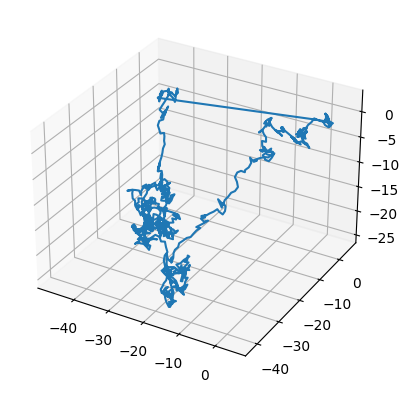

In [69]:
fig = plt.figure()

ax = fig.add_subplot(111, projection='3d')

ax.plot(traj[:,0],traj[:,1],traj[:,2])

plt.show()

# VO Retro

So as it looks like the the solution generates some VO but it drifts quite a lot as one can see from above figure. The next step should be to use local bundle-adjustment through a local map to reduce the amount of drift has been so far!

I found the following amazing repo which covers most:

repo -> https://github.com/felixchenfy/Monocular-Visual-Odometry
book -> the repo is based on -> https://github.com/gaoxiang12/slambook2

In [41]:
fx = 1549.84
fy = 1549.84
cx = 935.391
cy = 552.152

cam = PinholeCamera(camera_info.width, camera_info.height, fx, fy, cy, cx)
vo = VisualOdometry(cam)

traj = np.zeros((len(image_data),3))
# VO needs to be reinitialised if a new image stream is passed
for img_id in range(len(image_data)):
    # This VO tool is picky a
    image = cv2.cvtColor(image_data[img_id][1], cv2.COLOR_RGB2GRAY)
    cur_t = vo.cur_t
    
    if(img_id > 2):
        x, y, z = cur_t[0], cur_t[1], cur_t[2]
    else:
        x, y, z = 0., 0., 0.
    print(f"The coordinates for the frame {img_id} is: {x} {y} {z}")
    traj[img_id][0] = x
    traj[img_id][1] = y
    traj[img_id][2] = z    

The coordinates for the frame 0 is: 0.0 0.0 0.0
The coordinates for the frame 1 is: 0.0 0.0 0.0
The coordinates for the frame 2 is: 0.0 0.0 0.0


TypeError: 'NoneType' object is not subscriptable

In [1]:
def image_to_lidar_synchroniser(image_messages, n_images, lidar_messages, n_lidar, duration_threshold):
    
    number_of_frames = n_images
    if (n_lidar > n_images):
        number_of_frames = n_lidar

    synched_idx = 0
    
    # Get the first frame of the lidar message
    _, lidar_msg, lidar_t = next(lidar_messages)
    for i in range(number_of_frames):
        _, image_msg, image_t = next(image_messages)

        if(abs(lidar_t - image_t) < duration_threshold):
            logging.info('We found close enough frames!')
            logging.info(f'The difference is: {abs(lidar_t - image_t)/1e6} ms')
            break;

        synched_idx+=1
        
    return synched_idx

In [ ]:
number_of_frames = n_images
if (n_lidar > n_images):
    number_of_frames = n_lidar

synched_idx = 0

# Get the first frame of the lidar message
_, lidar_msg, lidar_t = next(lidar_messages)

for i in range(number_of_frames):
    _, image_msg, image_t = next(image_messages)
    
min(myList, key=lambda x:abs(x-myNumber))

In [90]:
lidar_messages = bag.read_messages(topics=['/points'])
n_lidar = bag.get_message_count(topic_filters=["/points"])

image_messages = bag.read_messages(topics=['/color/video/image'])
n_images = bag.get_message_count(topic_filters=["/color/video/image"])

# Acceptable duration time difference between the packets for sync up
duration_threshold = rospy.rostime.Duration(0.04)

# Synchronise the image and lidar messages
start_frame = image_to_lidar_synchroniser(image_messages, n_images, lidar_messages, n_lidar, duration_threshold)
print(start_frame)

INFO:root:We found close enough frames!
INFO:root:The difference is: 35 ms


142


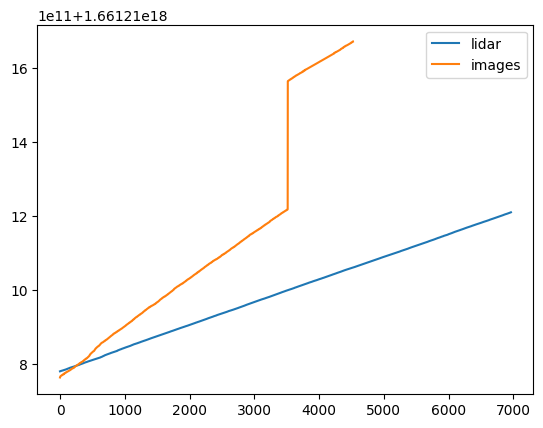

In [57]:
logger.setLevel(logging.NOTSET)

# importing package
import matplotlib.pyplot as plt
   
# plot lines
plt.plot(lidar_timestamps, label = "lidar")
plt.plot(image_timestamps, label = "images")
plt.legend()
plt.show()

In [61]:
import bagpy
from bagpy import bagreader
import pandas as pd

b = bagreader('/Users/jppersonal/dev/all_data_capture.bag')

# replace the topic name as per your need
laser_msgs = b.message_by_topic('/points')
df_laser = pd.read_csv(laser_msgs)

# replace the topic name as per your need
image_msgs = b.message_by_topic('/color/video/image')
df_images = pd.read_csv(image_msgs)

[INFO]  Successfully created the data folder /Users/jppersonal/dev/all_data_capture.


KeyboardInterrupt: 

In [97]:
imu_messages = bag.read_messages(topics=['/vn100_imu'])
n_imu = bag.get_message_count(topic_filters=["/vn100_imu"])


In [100]:
_, imu_msg, imu_t = next(imu_messages)
imu_msg

header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
orientation: 
  x: -0.002910308539867401
  y: 0.009733384475111961
  z: 0.893739640712738
  w: 0.44847115874290466
orientation_covariance: [1.9970353974653398e-05, 0.0, 0.0, 0.0, 2.52016219798712e-06, 0.0, 0.0, 0.0, 3.247205382940164e-06]
angular_velocity: 
  x: 0.038363467901945114
  y: 0.022292669862508774
  z: 0.02150445431470871
angular_velocity_covariance: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
linear_acceleration: 
  x: 0.394634485244751
  y: -0.7981901168823242
  z: -9.450268745422363
linear_acceleration_covariance: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

In [2]:
bag_file = '/Users/jppersonal/dev/ship_measurement_data.bag'
bag = rosbag.Bag(bag_file, "r")

lidar_messages = bag.read_messages(topics=['/points'])
n_lidar =10 #bag.get_message_count(topic_filters=["/points"])

image_messages = bag.read_messages(topics=['/color/video/image'])
n_images = 10#bag.get_message_count(topic_filters=["/color/video/image"])

depth_messages = bag.read_messages(topics=['/stereo/depth'])
n_depth_images = 10#bag.get_message_count(topic_filters=["/stereo/depth"])

logging.info('Loaded the data!')

lidar_timestamps = []
lidar_frame_data = []
for i in range(n_lidar):
    _, lidar_msg, lidar_t = next(lidar_messages)
    lidar_timestamps.append(lidar_t)
    
    frame_data = dict()
    frame_data["x"] = []
    frame_data["y"] = []
    frame_data["z"] = []
    
    for p in pc2.read_points(lidar_msg, field_names = ("x", "y", "z"), skip_nans=True):
        frame_data["x"].append(p[0])
        frame_data["y"].append(p[1])
        frame_data["z"].append(p[2])
        
    lidar_frame_data.append(frame_data)
    
logging.info('Parsed the lidar data!')

image_timestamps = []
image_frame_data = []
for i in range(n_images):
    _, image_msg, image_t = next(image_messages)
    image_timestamps.append(image_t)

    frame_data = dict()
    image_data = np.frombuffer(image_msg.data, np.uint8)
    # bgr data
    image_data_reshaped = np.reshape(image_data, (image_msg.height, image_msg.width, 3))
    frame_data["image"] = image_data_reshaped[:,:,::-1]
    image_frame_data.append(frame_data)

logging.info('Parsed the camera data!')

stereo_depth_timestamps = []
stereo_depth_data = []
for i in range(n_depth_images):
    _, depth_image_msg, depth_image_t = next(depth_messages)
    stereo_depth_timestamps.append(depth_image_t)

    frame_data = dict()
    data = np.frombuffer(depth_image_msg.data, np.uint8)
    image_data = np.zeros(depth_image_msg.height * depth_image_msg.width, np.uint16)
    for i in range(depth_image_msg.height * depth_image_msg.width):
        image_data[i] = data[2*i] + data[2*i] << 8
    # bgr data
    
    frame_data["image"] = np.reshape(image_data, (depth_image_msg.height, depth_image_msg.width)) #image_data_reshaped[:,:,::-1]
    stereo_depth_data.append(frame_data)

logging.info('Parsed the depth data!')


synchronised_indeces = []
for lidar_idx in range(0, len(lidar_timestamps)):
    image_idx = min(range(len(image_timestamps)), key=lambda idx: abs(image_timestamps[idx]-lidar_timestamps[lidar_idx]))
    synchronised_indeces.append([image_idx,lidar_idx])

logging.info('Found the synchronous frames!')

INFO:root:Loaded the data!
INFO:root:Parsed the lidar data!
INFO:root:Parsed the camera data!
/var/folders/sg/1gkk6vxs2pqg0hhg2ms8zvf80000gr/T/ipykernel_29255/3880673695.py:60: RuntimeWarning: overflow encountered in ubyte_scalars
  image_data[i] = data[2*i] + data[2*i] << 8
INFO:root:Parsed the depth data!
INFO:root:Found the synchronous frames!


In [3]:
depth_info_messages = bag.read_messages(topics=['/stereo/camera_info'])
n_depth_camera_info = bag.get_message_count(topic_filters=["/stereo/camera_info"])

_, depth_camera_info_msg, depth_camera_info_t = next(depth_info_messages)
depth_camera_info_msg

header: 
  seq: 0
  stamp: 
    secs: 1661258484
    nsecs: 368218019
  frame_id: "oak_right_camera_optical_frame"
height: 720
width: 1280
distortion_model: "rational_polynomial"
d: [-11.167383193969727, 111.09561157226562, -0.0006711966125294566, -0.0003307786537334323, -82.91315460205078, -11.202027320861816, 110.47784423828125, -81.39408111572266]
k: [809.1782836914062, 0.0, 638.8289794921875, 0.0, 809.1782836914062, 373.1198425292969, 0.0, 0.0, 1.0]
r: [0.9998652338981628, 0.0011987460311502218, 0.016374364495277405, -0.001228737528435886, 0.9999975562095642, 0.0018216792959719896, -0.016372140496969223, -0.0018415536032989621, 0.9998642802238464]
p: [809.1782836914062, 0.0, 638.8289794921875, 0.0, 0.0, 809.1782836914062, 373.1198425292969, 0.0, 0.0, 0.0, 1.0, 0.0]
binning_x: 0
binning_y: 0
roi: 
  x_offset: 0
  y_offset: 0
  height: 0
  width: 0
  do_rectify: False

DEBUG:matplotlib.font_manager:findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSansMono-BoldOblique.ttf', name='DejaVu Sans Mono', style='oblique', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/STIXSizThreeSymBol.ttf', name='STIXSizeThreeSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/STIXSizTwoSymBol.ttf', name='STIXSizeTwoSym', style='normal', variant='normal', weight=700, stretch='no

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/STIXSizTwoSymReg.ttf', name='STIXSizeTwoSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/cmmi10.ttf', name='cmmi10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.8/site-packages/matplotlib

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansChakma-Regular.ttf', name='Noto Sans Chakma', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Keyboard.ttf', name='.Keyboard', style='normal', variant='normal', weight=100, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/SFCompact.ttf', name='.SF Compact', style='normal', variant='normal', weight=1000, stretch='normal', size='scalable')) = 10.62
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Times New Roman Bold Italic.ttf', name='Times New Roman', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/AppleSDGothicNeo.ttc', name='Apple SD Gothic Neo', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Tahoma.ttf', name='Tahoma', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansMasaramGondi-Regular.otf', name='Noto Sans Masaram Gondi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansNabataean-Regular.ttf', name='Noto Sans Nabataean', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: sco

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansHatran-Regular.ttf', name='Noto Sans Hatran', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Courier New.ttf', name='Courier New', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansKhudawadi-Regular.ttf', name='Noto Sans Khudawadi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Waseem.ttc', name='Waseem', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(Font

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Hoefler Text Ornaments.ttf', name='Hoefler Text', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/STIXSizFourSymReg.otf', name='STIXSizeFourSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Apple Braille.ttf', name='Apple Braille', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Mishafi Gold.ttf', name='Mishafi Gold', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Syste

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/DIN Alternate Bold.ttf', name='DIN Alternate', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/STIXNonUni.otf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Tahoma Bold.ttf', name='Tahoma', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansEgyptianHieroglyphs-Regular.ttf', name='Noto Sans Egyptian Hieroglyphs', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont:

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/AlBayan.ttc', name='Al Bayan', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Kannada Sangam MN.ttc', name='Kannada Sangam MN', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/ヒラギノ角ゴシック W4.ttc', name='Hiragino Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansInscriptionalParthian-Regular.ttf', name='Noto Sans Inscriptional Parthian', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:find

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansCoptic-Regular.ttf', name='Noto Sans Coptic', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/STIXGeneralBolIta.otf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/fonts/OTF/SyrCOMUrhoyBold.otf', name='Serto Urhoy', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansInscriptionalPahlavi-Regular.ttf', name='Noto Sans Inscriptional Pahlavi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotli

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/EuphemiaCAS.ttc', name='Euphemia UCAS', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/fonts/OTF/SyrCOMJerusalemOutline.otf', name='Serto Jerusalem Outline', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Chalkduster.ttf', name='Chalkduster', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansCypriot-Regular.ttf', name='Noto Sans Cypriot', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontE

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Verdana.ttf', name='Verdana', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 3.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/MarkerFelt.ttc', name='Marker Felt', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/NotoSansMyanmar.ttc', name='Noto Sans Myanmar', style='normal', variant='normal', weight=900, stretch='normal', size='scalable')) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansKayahLi-Regular.ttf', name='Noto Sans Kayah Li', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/shar

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/fonts/OTF/SyrCOMTurAbdin.otf', name='Estrangelo TurAbdin', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Arial Black.ttf', name='Arial Black', style='normal', variant='normal', weight=900, stretch='normal', size='scalable')) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/ZapfDingbats.ttf', name='Zapf Dingbats', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/STIXIntSmReg.otf', name='STIXIntegralsSm', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/ヒラ

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/AmericanTypewriter.ttc', name='American Typewriter', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansLycian-Regular.ttf', name='Noto Sans Lycian', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/BigCaslon.ttf', name='Big Caslon', style='normal', variant='normal', weight=500, stretch='normal', size='scalable')) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/STIXIntDReg.otf', name='STIXIntegralsD', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/NotoNastaliq.ttc', name='Noto Nastaliq Urdu', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/fonts/OTF/SyrCOMQenNeshrin.otf', name='Estrangelo Quenneshrin', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansBassaVah-Regular.ttf', name='Noto Sans Bassa Vah', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Helvetica.ttc', name='Helvetica', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 7.322727272727273
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Sys

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansBhaiksuki-Regular.ttf', name='Noto Sans Bhaiksuki', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Apple Braille Pinpoint 6 Dot.ttf', name='Apple Braille', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/PTSerif.ttc', name='PT Serif', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Menlo.ttc', name='Menlo', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Sup

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Charter.ttc', name='Charter', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/KohinoorBangla.ttc', name='Kohinoor Bangla', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Tamil Sangam MN.ttc', name='Tamil Sangam MN', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/fonts/TTF/VeraMoBI.ttf', name='Bitstream Vera Sans Mono', style='oblique', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fon

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Farah.ttc', name='Farah', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Raanana.ttc', name='Raanana', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Arial Narrow Bold.ttf', name='Arial Narrow', style='normal', variant='normal', weight=700, stretch='condensed', size='scalable')) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Keyboard.ttf', name='.Keyboard', style='normal', variant='normal', weight=100, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/InaiMathi-MN

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Telugu MN.ttc', name='Telugu MN', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Songti.ttc', name='Songti SC', style='normal', variant='normal', weight=900, stretch='normal', size='scalable')) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansTaiLe-Regular.ttf', name='Noto Sans Tai Le', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansSamaritan-Regular.ttf', name='Noto Sans Samaritan', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Zapfino.ttf', name='Zapfino', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Wingdings 3.ttf', name='Wingdings 3', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansMiao-Regular.ttf', name='Noto Sans Miao', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Bodoni 72 OS.ttc', name='Bodoni 72 Oldstyle', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansOldItalic-Regular.ttf', name='Noto Sans Old Italic', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansYi-Regular.ttf', name='Noto Sans Yi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Courier New Italic.ttf', name='Courier New', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/NotoSansOriya.ttc', name='Noto Sans Oriya', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEnt

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Sana.ttc', name='Sana', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Courier New Bold.ttf', name='Courier New', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Bodoni Ornaments.ttf', name='Bodoni Ornaments', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansCaucasianAlbanian-Regular.ttf', name='Noto Sans Caucasian Albanian', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Arial.ttf', name='Arial', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 6.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansJavanese-Regular.otf', name='Noto Sans Javanese', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/NotoSerifMyanmar.ttc', name='Noto Serif Myanmar', style='normal', variant='normal', weight=900, stretch='normal', size='scalable')) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/fonts/TTF/luximri.ttf', name='Luxi Mono', style='oblique', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/SFCompactRounded.ttf', name='.SF Compact Rounded', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Avenir Next Condensed.ttc', name='Avenir Next Condensed', style='normal', variant='normal', weight=700, stretch='condensed', size='scalable')) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Georgia Bold.ttf', name='Georgia', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansNKo-Regular.ttf', name='Noto Sans NKo', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSansMono.ttf', name='DejaVu Sans Mono', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/STIXGeneralBol.ttf', name='STIXGeneral', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSansDisplay.ttf', name='DejaVu Sans Display', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Beirut.ttc', name='Beirut', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansOldPersian-Regular.ttf', name='Noto Sans Old Persian', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/ヒラギノ角ゴシック W1.ttc', name='Hiragino Sans', style='normal', variant='normal', weight=200, stretch='normal', size='scalable')) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansElbasan-Regular.ttf', name='Noto Sans Elbasan', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fn

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansImperialAramaic-Regular.ttf', name='Noto Sans Imperial Aramaic', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Apple Symbols.ttf', name='Apple Symbols', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/STHeiti Light.ttc', name='Heiti TC', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Corsiva.ttc', name='Corsiva Hebrew', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/L

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Hoefler Text.ttc', name='Hoefler Text', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Muna.ttc', name='Muna', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansHanunoo-Regular.ttf', name='Noto Sans Hanunoo', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansBuhid-Regular.ttf', name='Noto Sans Buhid', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSerifAhom-Regular.ttf', name='Noto Serif Ahom', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansNewa-Regular.ttf', name='Noto Sans Newa', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/ヒラギノ角ゴシック W4.ttc', name='Hiragino Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Marion.ttc', name='Marion', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Libra

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansPhagsPa-Regular.ttf', name='Noto Sans PhagsPa', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansBuginese-Regular.ttf', name='Noto Sans Buginese', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Chalkboard.ttc', name='Chalkboard', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Ayuthaya.ttf', name='Ayuthaya', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fnam

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/STIXIntUpReg.otf', name='STIXIntegralsUp', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/fonts/OTF/SyrCOMAntioch.otf', name='Estrangelo Antioch', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansLinearB-Regular.ttf', name='Noto Sans Linear B', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansSharada-Regular.ttf', name='Noto Sans Sharada', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfon

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Trebuchet MS.ttf', name='Trebuchet MS', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Malayalam MN.ttc', name='Malayalam MN', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansTaiViet-Regular.ttf', name='Noto Sans Tai Viet', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansCham-Regular.ttf', name='Noto Sans Cham', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(Fon

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansLisu-Regular.ttf', name='Noto Sans Lisu', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Marion.ttc', name='Marion', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansKhojki-Regular.ttf', name='Noto Sans Khojki', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Helvetica.ttc', name='Helvetica', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 7.322727272727273
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/o

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/SFArabic.ttf', name='.SF Arabic', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Songti.ttc', name='Songti SC', style='normal', variant='normal', weight=900, stretch='normal', size='scalable')) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/BigCaslon.ttf', name='Big Caslon', style='normal', variant='normal', weight=500, stretch='normal', size='scalable')) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansCuneiform-Regular.ttf', name='Noto Sans Cuneiform', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Su

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Athelas.ttc', name='Athelas', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/STIXSizThreeSymBol.otf', name='STIXSizeThreeSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansKharoshthi-Regular.ttf', name='Noto Sans Kharoshthi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansMiao-Regular.ttf', name='Noto Sans Miao', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfon

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Bangla Sangam MN.ttc', name='Bangla Sangam MN', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Courier New.ttf', name='Courier New', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/STIXSizTwoSymReg.otf', name='STIXSizeTwoSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansBassaVah-Regular.ttf', name='Noto Sans Bassa Vah', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontE

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Brush Script.ttf', name='Brush Script MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/STIXSizTwoSymReg.otf', name='STIXSizeTwoSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Thonburi.ttc', name='Thonburi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/SFNS.ttf', name='System Font', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Times New Roman.tt

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Skia.ttf', name='Skia', style='normal', variant='normal', weight=5, stretch='normal', size='scalable')) = 10.42525
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Comic Sans MS.ttf', name='Comic Sans MS', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansNewTaiLue-Regular.ttf', name='Noto Sans New Tai Lue', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansKhojki-Regular.ttf', name='Noto Sans Khojki', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fna

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansImperialAramaic-Regular.ttf', name='Noto Sans Imperial Aramaic', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansYi-Regular.ttf', name='Noto Sans Yi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/DIN Condensed Bold.ttf', name='DIN Condensed', style='normal', variant='normal', weight=700, stretch='condensed', size='scalable')) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansKhudawadi-Regular.ttf', name='Noto Sans Khudawadi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Copperplate.ttc', name='Copperplate', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Charter.ttc', name='Charter', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansMeroitic-Regular.ttf', name='Noto Sans Meroitic', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/KufiStandardGK.ttc', name='KufiStandardGK', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Sy

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/PTSerifCaption.ttc', name='PT Serif Caption', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansTifinagh-Regular.ttf', name='Noto Sans Tifinagh', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansMasaramGondi-Regular.otf', name='Noto Sans Masaram Gondi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/STIXSizOneSymReg.otf', name='STIXSizeOneSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_man

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Wingdings 2.ttf', name='Wingdings 2', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Apple Braille.ttf', name='Apple Braille', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSerifAhom-Regular.ttf', name='Noto Serif Ahom', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Andale Mono.ttf', name='Andale Mono', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/DIN Condensed Bold.ttf', name='DIN Condensed', style='normal', variant='normal', weight=700, stretch='condensed', size='scalable')) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Waseem.ttc', name='Waseem', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Verdana Bold Italic.ttf', name='Verdana', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 4.971363636363637
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/STIXGeneralItalic.otf', name='STIXGeneral', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/o

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/PTMono.ttc', name='PT Mono', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Didot.ttc', name='Didot', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/SFArabic.ttf', name='.SF Arabic', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansDuployan-Regular.ttf', name='Noto Sans Duployan', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplement

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/STIXIntUpSmBol.otf', name='STIXIntegralsUpSm', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansVai-Regular.ttf', name='Noto Sans Vai', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/ヒラギノ角ゴシック W1.ttc', name='Hiragino Sans', style='normal', variant='normal', weight=200, stretch='normal', size='scalable')) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansTaiTham-Regular.ttf', name='Noto Sans Tai Tham', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/S

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansTaiViet-Regular.ttf', name='Noto Sans Tai Viet', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Georgia Bold Italic.ttf', name='Georgia', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Lao Sangam MN.ttf', name='Lao Sangam MN', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/fonts/OTF/SyrCOMCtesiphon.otf', name='East Syriac Ctesiphon', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEn

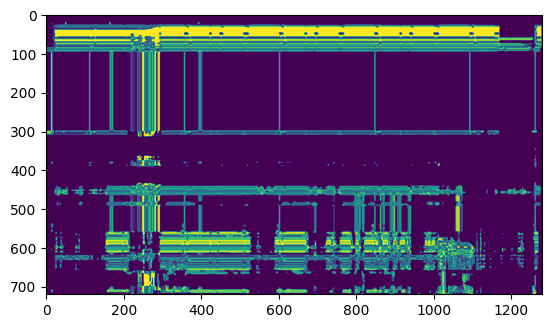

In [6]:
fig = plt.figure()
plt.imshow(stereo_depth_data[5]["image"])
plt.show()

In [7]:
import open3d as o3d

In [8]:
def convert(img, target_type_min, target_type_max, target_type):
    imin = img.min()
    imax = img.max()

    a = (target_type_max - target_type_min) / (imax - imin)
    b = target_type_max - a * imax
    new_img = (a * img + b).astype(target_type)
    return new_img

In [9]:
color_image = o3d.geometry.Image(image_frame_data[1]["image"].astype(np.uint8))
downsampled_color_image = image_frame_data[7]["image"][180:900, 320:1600, :]
imgu8 = convert(stereo_depth_data[9]["image"], 0, 255, np.uint8)


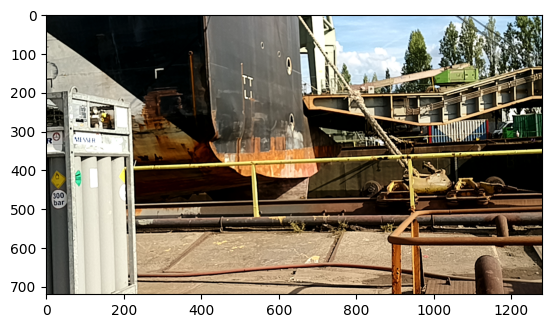

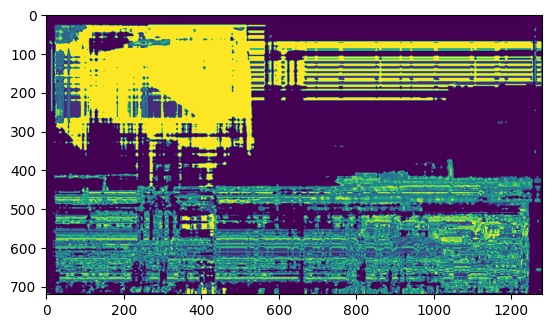

In [10]:
downsampled_color_image = image_frame_data[9]["image"][180:900, 320:1600, :]
#downsampled_color_image.shape
fig = plt.figure()
plt.imshow(downsampled_color_image)
plt.show()

#downsampled_color_image.shape
fig = plt.figure()
plt.imshow(imgu8)
plt.show()

In [11]:
color_image = o3d.geometry.Image(downsampled_color_image.astype(np.uint8))
depth_image = o3d.geometry.Image(imgu8)
rgbd_image = o3d.geometry.RGBDImage.create_from_color_and_depth(
    color_image, depth_image)

DEBUG:matplotlib.font_manager:findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=12.0.
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSansMono-BoldOblique.ttf', name='DejaVu Sans Mono', style='oblique', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/STIXSizThreeSymBol.ttf', name='STIXSizeThreeSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/STIXSizTwoSymBol.ttf', name='STIXSizeTwoSym', style='normal', variant='normal', weight=700, stretch='no

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/STIXSizTwoSymReg.ttf', name='STIXSizeTwoSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/cmmi10.ttf', name='cmmi10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Users/jppersonal/dev/rosbagconverter/lib/python3.8/site-packages/matplotlib

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansChakma-Regular.ttf', name='Noto Sans Chakma', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Keyboard.ttf', name='.Keyboard', style='normal', variant='normal', weight=100, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/SFCompact.ttf', name='.SF Compact', style='normal', variant='normal', weight=1000, stretch='normal', size='scalable')) = 10.62
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Times New Roman Bold Italic.ttf', name='Times New Roman', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/AppleSDGothicNeo.ttc', name='Apple SD Gothic Neo', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Tahoma.ttf', name='Tahoma', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansMasaramGondi-Regular.otf', name='Noto Sans Masaram Gondi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansNabataean-Regular.ttf', name='Noto Sans Nabataean', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: sco

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansHatran-Regular.ttf', name='Noto Sans Hatran', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Courier New.ttf', name='Courier New', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansKhudawadi-Regular.ttf', name='Noto Sans Khudawadi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Waseem.ttc', name='Waseem', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(Font

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Hoefler Text Ornaments.ttf', name='Hoefler Text', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/STIXSizFourSymReg.otf', name='STIXSizeFourSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Apple Braille.ttf', name='Apple Braille', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Mishafi Gold.ttf', name='Mishafi Gold', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Syste

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/DIN Alternate Bold.ttf', name='DIN Alternate', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/STIXNonUni.otf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Tahoma Bold.ttf', name='Tahoma', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansEgyptianHieroglyphs-Regular.ttf', name='Noto Sans Egyptian Hieroglyphs', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont:

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/AlBayan.ttc', name='Al Bayan', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Kannada Sangam MN.ttc', name='Kannada Sangam MN', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/ヒラギノ角ゴシック W4.ttc', name='Hiragino Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansInscriptionalParthian-Regular.ttf', name='Noto Sans Inscriptional Parthian', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:find

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansCoptic-Regular.ttf', name='Noto Sans Coptic', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/STIXGeneralBolIta.otf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/fonts/OTF/SyrCOMUrhoyBold.otf', name='Serto Urhoy', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansInscriptionalPahlavi-Regular.ttf', name='Noto Sans Inscriptional Pahlavi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotli

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/EuphemiaCAS.ttc', name='Euphemia UCAS', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/fonts/OTF/SyrCOMJerusalemOutline.otf', name='Serto Jerusalem Outline', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Chalkduster.ttf', name='Chalkduster', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansCypriot-Regular.ttf', name='Noto Sans Cypriot', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontE

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Verdana.ttf', name='Verdana', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 3.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/MarkerFelt.ttc', name='Marker Felt', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/NotoSansMyanmar.ttc', name='Noto Sans Myanmar', style='normal', variant='normal', weight=900, stretch='normal', size='scalable')) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansKayahLi-Regular.ttf', name='Noto Sans Kayah Li', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/shar

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/fonts/OTF/SyrCOMTurAbdin.otf', name='Estrangelo TurAbdin', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Arial Black.ttf', name='Arial Black', style='normal', variant='normal', weight=900, stretch='normal', size='scalable')) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/ZapfDingbats.ttf', name='Zapf Dingbats', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/STIXIntSmReg.otf', name='STIXIntegralsSm', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/ヒラ

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/AmericanTypewriter.ttc', name='American Typewriter', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansLycian-Regular.ttf', name='Noto Sans Lycian', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/BigCaslon.ttf', name='Big Caslon', style='normal', variant='normal', weight=500, stretch='normal', size='scalable')) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/STIXIntDReg.otf', name='STIXIntegralsD', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/NotoNastaliq.ttc', name='Noto Nastaliq Urdu', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/fonts/OTF/SyrCOMQenNeshrin.otf', name='Estrangelo Quenneshrin', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansBassaVah-Regular.ttf', name='Noto Sans Bassa Vah', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Helvetica.ttc', name='Helvetica', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 7.322727272727273
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/Sys

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansBhaiksuki-Regular.ttf', name='Noto Sans Bhaiksuki', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Apple Braille Pinpoint 6 Dot.ttf', name='Apple Braille', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/PTSerif.ttc', name='PT Serif', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Menlo.ttc', name='Menlo', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Sup

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Charter.ttc', name='Charter', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/KohinoorBangla.ttc', name='Kohinoor Bangla', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Tamil Sangam MN.ttc', name='Tamil Sangam MN', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/fonts/TTF/VeraMoBI.ttf', name='Bitstream Vera Sans Mono', style='oblique', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fon

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Farah.ttc', name='Farah', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/Raanana.ttc', name='Raanana', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Arial Narrow Bold.ttf', name='Arial Narrow', style='normal', variant='normal', weight=700, stretch='condensed', size='scalable')) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Keyboard.ttf', name='.Keyboard', style='normal', variant='normal', weight=100, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/InaiMathi-MN

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Telugu MN.ttc', name='Telugu MN', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Songti.ttc', name='Songti SC', style='normal', variant='normal', weight=900, stretch='normal', size='scalable')) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansTaiLe-Regular.ttf', name='Noto Sans Tai Le', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansSamaritan-Regular.ttf', name='Noto Sans Samaritan', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Zapfino.ttf', name='Zapfino', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Wingdings 3.ttf', name='Wingdings 3', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansMiao-Regular.ttf', name='Noto Sans Miao', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Bodoni 72 OS.ttc', name='Bodoni 72 Oldstyle', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansOldItalic-Regular.ttf', name='Noto Sans Old Italic', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansYi-Regular.ttf', name='Noto Sans Yi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Courier New Italic.ttf', name='Courier New', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/NotoSansOriya.ttc', name='Noto Sans Oriya', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEnt

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Sana.ttc', name='Sana', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Courier New Bold.ttf', name='Courier New', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Bodoni Ornaments.ttf', name='Bodoni Ornaments', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansCaucasianAlbanian-Regular.ttf', name='Noto Sans Caucasian Albanian', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Arial.ttf', name='Arial', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 6.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/Supplemental/NotoSansJavanese-Regular.otf', name='Noto Sans Javanese', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/NotoSerifMyanmar.ttc', name='Noto Serif Myanmar', style='normal', variant='normal', weight=900, stretch='normal', size='scalable')) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/fonts/TTF/luximri.ttf', name='Luxi Mono', style='oblique', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/opt/X11/share/system_fonts/SFCompactRounded.ttf', name='.SF Compact Rounded', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Avenir Next Condensed.ttc', name='Avenir Next Condensed', style='normal', variant='normal', weight=700, stretch='condensed', size='scalable')) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Georgia Bold.ttf', name='Georgia', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansNKo-Regular.ttf', name='Noto Sans NKo', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/

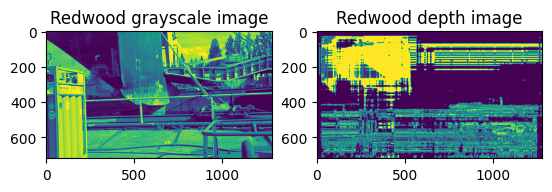

In [12]:
logger.setLevel(logging.NOTSET)

plt.subplot(1, 2, 1)
plt.title('Redwood grayscale image')
plt.imshow(rgbd_image.color)
plt.subplot(1, 2, 2)
plt.title('Redwood depth image')
plt.imshow(rgbd_image.depth)
plt.show()

In [41]:
pcd

PointCloud with 493820 points.

In [1]:
# The pinhole estimations have been taken from http://www.open3d.org/docs/latest/tutorial/Basic/rgbd_image.html
# they are wrong
intrinsics = o3d.camera.PinholeCameraIntrinsic(depth_camera_info_msg.width, depth_camera_info_msg.height, 525.0, 525.0, 319.5, 239.5)

pcd = o3d.geometry.PointCloud.create_from_rgbd_image(
    rgbd_image,
    intrinsics)
# Flip it, otherwise the pointcloud will be upside down
pcd.transform([[1, 0, 0, 0], [0, -1, 0, 0], [0, 0, -1, 0], [0, 0, 0, 1]])
o3d.visualization.draw_geometries([pcd], zoom=0.3412,
                                  front=[0.4257, -0.2125, -0.8795],
                                  lookat=[2.6172, 2.0475, 1.532],
                                  up=[-0.0694, -0.9768, 0.2024])

NameError: name 'o3d' is not defined

In [3]:
import numpy as np
import math

# taken from https://stackoverflow.com/a/6802723
# based on -> https://en.wikipedia.org/wiki/Euler%E2%80%93Rodrigues_formula

def rotation_matrix(axis, theta):
    """
    Return the rotation matrix associated with counterclockwise rotation about
    the given axis by theta radians.
    """
    axis = np.asarray(axis)
    axis = axis / math.sqrt(np.dot(axis, axis))
    a = math.cos(theta / 2.0)
    b, c, d = -axis * math.sin(theta / 2.0)
    aa, bb, cc, dd = a * a, b * b, c * c, d * d
    bc, ad, ac, ab, bd, cd = b * c, a * d, a * c, a * b, b * d, c * d
    return np.array([[aa + bb - cc - dd, 2 * (bc + ad), 2 * (bd - ac)],
                     [2 * (bc - ad), aa + cc - bb - dd, 2 * (cd + ab)],
                     [2 * (bd + ac), 2 * (cd - ab), aa + dd - bb - cc]])


In [12]:
logger.setLevel(logging.NOTSET)

# laser coloring related constants
color_factor = 10
colorMode = "range"

for i in range(7000,len(synchronised_indeces)):
    clear_output(wait=True)
    
    # [image_frame_idx, laser_frame_idx]
    current_frame_idx = synchronised_indeces[i]
    
    fig = plt.figure(figsize=(20,20))
    ax = fig.add_subplot(221, projection='3d')
    ax2 = fig.add_subplot(222)

    np_x = numpy.array(lidar_frame_data[current_frame_idx[1]]["x"])
    np_y = numpy.array(lidar_frame_data[current_frame_idx[1]]["y"])
    np_z = numpy.array(lidar_frame_data[current_frame_idx[1]]["z"])
    
    np_x = np.reshape(np_x, (np_x.shape[0], 1))
    np_y = np.reshape(np_y, (np_y.shape[0], 1))
    np_z = np.reshape(np_z, (np_z.shape[0], 1))

    points = np.concatenate((np_x, np_y, np_z), axis=1)

    rotated_points = np.zeros((points.shape))
    for row in range(points.shape[0]):
        rotated_points[row] = np.dot(rotation_matrix([0,0,1], np.pi/4), points[row,:])

    if(colorMode == "range"):
        dist = np.sqrt(np.square(np_x) + np.square(np_y))
        dist_min = dist.min()
        dist_max = dist.max()
        
        color_graph = color_factor*dist/(dist_max - dist_min)
                          
    #color_graph = 10*np.linspace(0, 1,np_z.shape[0])
    ax.scatter(rotated_points[:,0],rotated_points[:,1],rotated_points[:,2], c = color_graph, alpha=0.5, s=2)
    ax2.imshow(image_frame_data[current_frame_idx[0]]["image"])
    ax2.text(1,35,str(i))

    
    ax.set_zlim3d(-2, 10) 
    ax.set_ylim3d(-50, 50)     
    ax.set_xlim3d(-50, 50)   
    plt.show()

KeyboardInterrupt: 

<Figure size 2000x2000 with 0 Axes>

In [11]:
np.pi

3.141592653589793

In [ ]:
logger.setLevel(logging.NOTSET)

# laser coloring related constants
color_factor = 10
colorMode = "range"

for i in range(1500,len(synchronised_indeces)):
    clear_output(wait=True)
    
    # [image_frame_idx, laser_frame_idx]
    current_frame_idx = synchronised_indeces[i]
    
    fig = plt.figure(figsize=(20,20))
    ax = fig.add_subplot(221, projection='3d')
    ax2 = fig.add_subplot(222)

    np_x = numpy.array(lidar_frame_data[current_frame_idx[1]]["x"])
    np_y = numpy.array(lidar_frame_data[current_frame_idx[1]]["y"])
    np_z = numpy.array(lidar_frame_data[current_frame_idx[1]]["z"])
    
    if(colorMode == "range"):
        dist = np.sqrt(np.square(np_x) + np.square(np_y))
        dist_min = dist.min()
        dist_max = dist.max()
        
        color_graph = color_factor*dist/(dist_max - dist_min)
                          
    #color_graph = 10*np.linspace(0, 1,np_z.shape[0])
    ax.scatter(np_x,-np_y,np_z, c = color_graph, alpha=0.2, s=2)
    ax2.imshow(image_frame_data[current_frame_idx[0]]["image"])
    
    ax.set_zlim3d(-2, 10) 
    ax.set_ylim3d(-50, 50)     
    ax.set_xlim3d(-50, 50)   
    plt.show()

In [58]:
bag_file = '/Users/jppersonal/dev/all_data_capture.bag'
bag = rosbag.Bag(bag_file, "r")

lidar_messages = bag.read_messages(topics=['/points'])
n_lidar = bag.get_message_count(topic_filters=["/points"])

image_messages = bag.read_messages(topics=['/color/video/image'])
n_images = bag.get_message_count(topic_filters=["/color/video/image"])
    
for i in range(start_frame, n_lidar-2):
    _, image_msg, image_t = next(image_messages)
    _, lidar_msg, lidar_t = next(lidar_messages)
    
    frame_data = dict()
    frame_data["time"] = lidar_t
    frame_data["frame_id"] = i
    frame_data["x"] = []
    frame_data["y"] = []
    frame_data["z"] = []
    frame_data["image"] = []
    
    for p in pc2.read_points(lidar_msg, field_names = ("x", "y", "z"), skip_nans=True):
        frame_data["x"].append(p[0])
        frame_data["y"].append(p[1])
        frame_data["z"].append(p[2])
        
    
    image_data = np.frombuffer(image_msg.data, np.uint8)
    
    # bgr data
    image_data_reshaped = np.reshape(image_data, (image_msg.height, image_msg.width, 3))
    frame_data["image"] = image_data_reshaped[:,:,::-1]
    
    frames.append(frame_data)

INFO:root:We found close enough frames!
INFO:root:The difference is: 35 ms


NameError: name 't' is not defined

In [ ]:
indeces = []
for lidar_idx in range(0, len(lidar_timestamps)):
    image_idx = min(range(len(image_timestamps)), key=lambda idx: abs(image_timestamps[idx]-lidar_timestamps[lidar_idx]))
    indeces.append([image_idx,lidar_idx])

IndexError: list index out of range

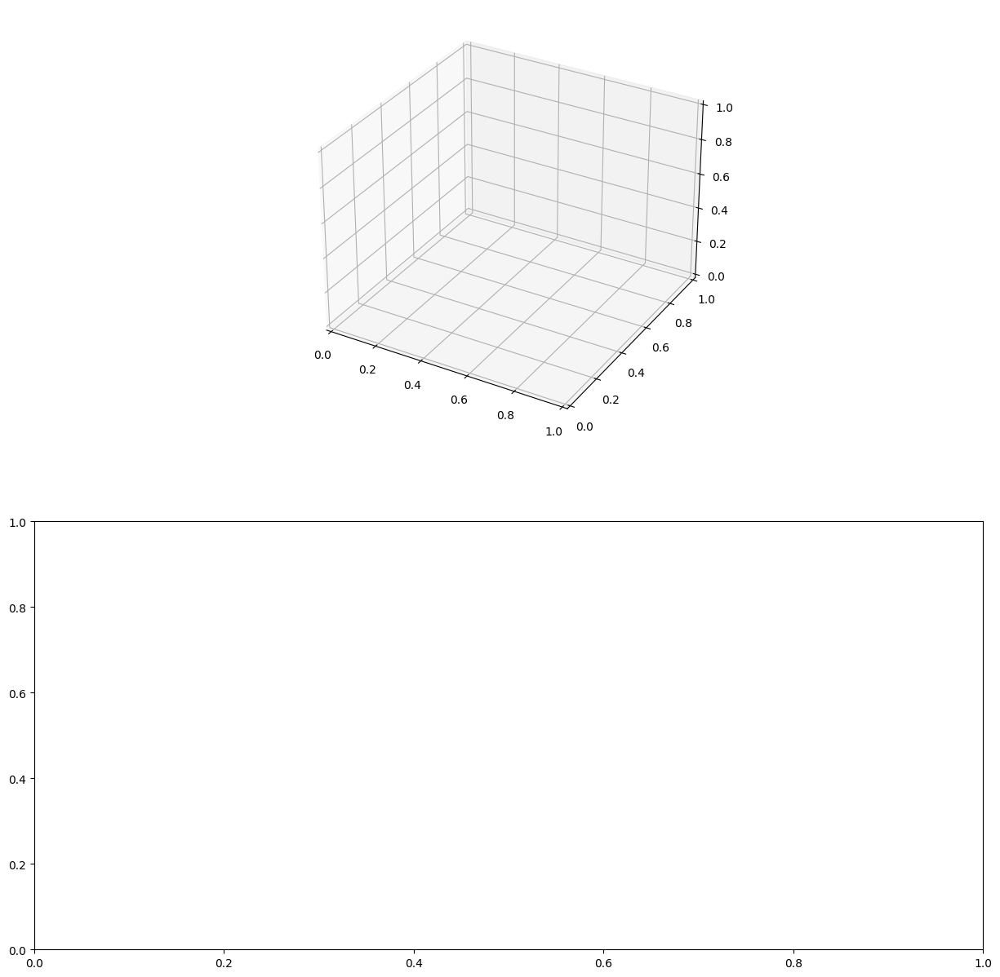

In [101]:
logger.setLevel(logging.NOTSET)

# laser coloring related constants
color_factor = 10
colorMode = "range"
start_offset = 20
number_of_frame_to_visualise = 100

for i in range(start_frame + start_offset,start_frame + start_offset + number_of_frame_to_visualise):
    clear_output(wait=True)
    
    fig = plt.figure(figsize=(15,15))
    ax = fig.add_subplot(211, projection='3d')
    ax2 = fig.add_subplot(212)

    np_x = numpy.array(frames[i]["x"])
    np_y = numpy.array(frames[i]["y"])
    np_z = numpy.array(frames[i]["z"])
    
    if(colorMode == "range"):
        dist = np.sqrt(np.square(np_x) + np.square(np_y))
        dist_min = dist.min()
        dist_max = dist.max()
        
        color_graph = color_factor*dist/(dist_max - dist_min)
                          
    #color_graph = 10*np.linspace(0, 1,np_z.shape[0])
    ax.scatter(np_x,np_y,np_z, c = color_graph, alpha=0.5, s=2)
    ax2.imshow(frames[i]["image"])
    
    ax.set_zlim3d(-2, 10) 
    ax.set_ylim3d(-20, 20)     
    ax.set_xlim3d(-20, 20)   
    plt.show()

In [ ]:
# TODO(jp): save the xyz points as a np array in the first hand
#np_x = numpy.reshape(numpy.array(frames[0]["x"]), (len(frames[0]["x"]),1))
np_x = numpy.array(frames[0]["x"])
#np_y = numpy.reshape(numpy.array(frames[0]["y"]), (len(frames[0]["y"]),1))
np_y = numpy.array(frames[0]["y"])

#np_z = numpy.reshape(numpy.array(frames[0]["z"]), (len(frames[0]["z"]),1))
np_z = numpy.array(frames[0]["z"])
                   
#points = np.concatenate((np_x, np_y,np_z),axis=1)

In [ ]:
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(points)
#pcd.colors = o3d.utility.Vector3dVector(colors)

visualizer = JVisualizer()
visualizer.add_geometry(pcd)
visualizer.show()

In [94]:
from IPython.display import clear_output

#angle = 1.5

for i in range(100):
    clear_output(wait=True)
    
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111, projection='3d')
    np_x = numpy.array(frames[i]["x"])
    np_y = numpy.array(frames[i]["y"])
    np_z = numpy.array(frames[i]["z"])
    
    
    ax.scatter(np_x,np_y,np_z)
    plt.show()

KeyboardInterrupt: 

<Figure size 1000x1000 with 0 Axes>

In [16]:
import numpy as np
import open3d as o3d

# TODO(jp): save the xyz points as a np array in the first hand
np_x = numpy.reshape(numpy.array(frames[0]["x"]), (len(frames[0]["x"]),1))
np_y = numpy.reshape(numpy.array(frames[0]["y"]), (len(frames[0]["y"]),1))
np_z = numpy.reshape(numpy.array(frames[0]["z"]), (len(frames[0]["z"]),1))
                   
points = np.concatenate((np_x, np_y,np_z),axis=1)

pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(points)
o3d.io.write_point_cloud("test.ply", pcd)

True

In [21]:
import laspy
import numpy as np
for i in range(50):
    np_x = numpy.reshape(numpy.array(frames[i]["x"]), (len(frames[0]["x"]),1))
    np_y = numpy.reshape(numpy.array(frames[i]["y"]), (len(frames[0]["y"]),1))
    np_z = numpy.reshape(numpy.array(frames[i]["z"]), (len(frames[0]["z"]),1))

    points = np.concatenate((np_x, np_y,np_z),axis=1)
    # 1. Create a new header
    header = laspy.LasHeader(point_format=3, version="1.2")
    header.add_extra_dim(laspy.ExtraBytesParams(name="ouster_pointcloud", type=np.int32))
    header.offsets = np.min(points, axis=0)
    header.scales = np.array([0.1, 0.1, 0.1])

    # 2. Create a Las
    las = laspy.LasData(header)

    las.x = points[:,0]
    las.y = points[:,1]
    las.z = points[:,2]
    las.random = np.random.randint(-1503, 6546, len(las.points), np.int32)

    las.write("new_file" + "_" + str(i) + ".las")